In [1]:
#%load_ext pycodestyle_magic
#%pycodestyle_on
#%pycodestyle_off

# 1. Exploration et présentation générale du jeu de données

> On va importer tous les fichiers csv du jeu de données de Olist en utilisant l'API de Kaggle pour importer le fichier zip <font color='red'>brazilian-ecommerce.zip</font> qui contient tous les fichiers csv.

In [107]:
!kaggle datasets download -d olistbr/brazilian-ecommerce

* On décompresse le fichier principale ainsi que tous les fichiers zip àl'intélieur :

In [108]:
from zipfile import ZipFile


file_name = "brazilian-ecommerce.zip"

with ZipFile(file_name, 'r') as zip_1:
    zip_1.printdir()
    print('Extracting all the files now...')
    zip_1.extractall()
    print('Done!')

* Création des différents **dataframe** pour chaque fichier :

In [97]:
import numpy as np
import pandas as pd
from pandas import DataFrame
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from sklearn import linear_model
from sklearn import decomposition
from sklearn import preprocessing
from sklearn import kernel_ridge
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import missingno as msno
import warnings
import folium
warnings.filterwarnings('ignore')

sns.set()

missing_values = ["na", "n/a", "--", " "]
data_customers = pd.read_csv("olist_customers_dataset.csv",
                             sep=',', na_values=missing_values,
                             low_memory=False)
data_geolocation = pd.read_csv("olist_geolocation_dataset.csv",
                               sep=',', na_values=missing_values,
                               low_memory=False)
data_order_items = pd.read_csv("olist_order_items_dataset.csv",
                               sep=',', na_values=missing_values,
                               low_memory=False)
data_order_payments = pd.read_csv("olist_order_payments_dataset.csv",
                                  sep=',', na_values=missing_values,
                                  low_memory=False)
data_order_reviews = pd.read_csv("olist_order_reviews_dataset.csv",
                                 sep=',', na_values=missing_values,
                                 low_memory=False)
data_orders = pd.read_csv("olist_orders_dataset.csv",
                          sep=',', na_values=missing_values,
                          low_memory=False)
data_products = pd.read_csv("olist_products_dataset.csv",
                            sep=',', na_values=missing_values,
                            low_memory=False)
data_sellers = pd.read_csv("olist_sellers_dataset.csv",
                           sep=',', na_values=missing_values,
                           low_memory=False)
data_category_name = pd.read_csv("product_category_name_translation.csv",
                                 sep=',', na_values=missing_values,
                                 low_memory=False)

## a) Affichage des lignes en début de fichier

### Fichier **orders** :

In [98]:
data_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


* Affichage des colonnes et lignes, ansi que leurs nombres

In [99]:
print("Nombre de lignes du fichier train   : ", data_orders.shape[0])
print('Nombre de colonnes du fichier train : ', data_orders.shape[1])

Nombre de lignes du fichier train   :  99441
Nombre de colonnes du fichier train :  8


### Fichier customers :

In [100]:
data_customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


* Affichage des colonnes et lignes, ansi que leurs nombres

In [101]:
print("Nombre de lignes du fichier train   : ", data_customers.shape[0])
print('Nombre de colonnes du fichier train : ', data_customers.shape[1])

Nombre de lignes du fichier train   :  99441
Nombre de colonnes du fichier train :  5


### Fichier order_payments :

In [102]:
data_order_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


* Affichage des colonnes et lignes, ansi que leurs nombres

In [103]:
print("Nombre de lignes du fichier train   : ", data_order_payments.shape[0])
print('Nombre de colonnes du fichier train : ', data_order_payments.shape[1])

Nombre de lignes du fichier train   :  103886
Nombre de colonnes du fichier train :  5


### Fichier order_reviews :

In [104]:
data_order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


* Affichage des colonnes et lignes, ansi que leurs nombres

In [105]:
print("Nombre de lignes du fichier train   : ", data_order_reviews.shape[0])
print('Nombre de colonnes du fichier train : ', data_order_reviews.shape[1])

Nombre de lignes du fichier train   :  100000
Nombre de colonnes du fichier train :  7


### Fichier order_items :

In [106]:
data_order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


* Affichage des colonnes et lignes, ansi que leurs nombres

In [107]:
print("Nombre de lignes du fichier train   : ", data_order_items.shape[0])
print('Nombre de colonnes du fichier train : ', data_order_items.shape[1])

Nombre de lignes du fichier train   :  112650
Nombre de colonnes du fichier train :  7


### Fichier products :

In [108]:
data_products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


* Affichage des colonnes et lignes, ansi que leurs nombres

In [109]:
print("Nombre de lignes du fichier train   : ", data_products.shape[0])
print('Nombre de colonnes du fichier train : ', data_products.shape[1])

Nombre de lignes du fichier train   :  32951
Nombre de colonnes du fichier train :  9


### Fichier category_name :

In [110]:
data_category_name.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


* Affichage des colonnes et lignes, ansi que leurs nombres

In [111]:
print("Nombre de lignes du fichier train   : ", data_category_name.shape[0])
print('Nombre de colonnes du fichier train : ', data_category_name.shape[1])

Nombre de lignes du fichier train   :  71
Nombre de colonnes du fichier train :  2


### Fichier sellers :

In [112]:
data_sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


* Affichage des colonnes et lignes, ansi que leurs nombres

In [113]:
print("Nombre de lignes du fichier train   : ", data_sellers.shape[0])
print('Nombre de colonnes du fichier train : ', data_sellers.shape[1])

Nombre de lignes du fichier train   :  3095
Nombre de colonnes du fichier train :  4


### Fichier geolocalisation :

In [114]:
data_geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


* Affichage des colonnes et lignes, ansi que leurs nombres

In [115]:
print("Nombre de lignes du fichier train   : ", data_geolocation.shape[0])
print('Nombre de colonnes du fichier train : ', data_geolocation.shape[1])

Nombre de lignes du fichier train   :  1000163
Nombre de colonnes du fichier train :  5


## b) Affichage du nombre de valeurs manquantes dans les fichiers

### data_orders :

In [116]:
nb_col_nan = data_orders.isnull().sum()
nb_col_nan

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

> On peut définir le pourcentage de données manquantes dans notre dataset :

In [117]:
nb_tot_cells_df = np.product(data_orders.shape)
nb_tot_cells_manq = nb_col_nan.sum()

pct = (nb_tot_cells_manq / nb_tot_cells_df) * 100
print('Pourcentage de cellules manquantes   : ', pct)

Pourcentage de cellules manquantes   :  0.616948743476031


* Visualisation des données manquantes :

> On peut utliser le package **missingno** qui permet de visualiser les données manquantes dans les        différentes colonnes de notre dataframe **data_orders**:

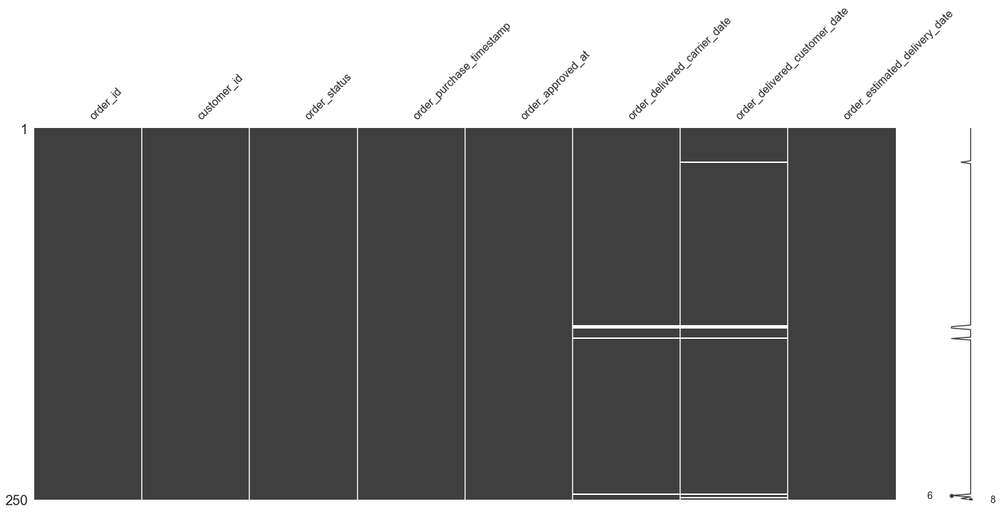

In [118]:
msno.matrix(data_orders.sample(250))

## c) Data cleaning

* Il faut convertir les chaines de caractères contenant les dates en données de type datetime afin de pouvoir faire des opérations sur les dates :

In [119]:
subset_2016 = data_orders[data_orders.order_purchase_timestamp.str.contains("2016") == True]
subset_2017 = data_orders[data_orders.order_purchase_timestamp.str.contains("2017") == True]
subset_2018 = data_orders[data_orders.order_purchase_timestamp.str.contains("2018") == True]

subset_2016.insert(4, "order_purchase_month",
                   subset_2016["order_purchase_timestamp"].values,
                   True)
subset_2017.insert(4, "order_purchase_month",
                   subset_2017["order_purchase_timestamp"].values,
                   True)
subset_2018.insert(4, "order_purchase_month",
                   subset_2018["order_purchase_timestamp"].values,
                   True)


def convert(df, columns_list):
    
    
    for column in columns_list:
        df[column] = pd.to_datetime(df[column])


cols = ['order_purchase_timestamp', 'order_approved_at',
        'order_delivered_carrier_date', 'order_delivered_customer_date',
        'order_estimated_delivery_date']

convert(data_orders, cols)

* Il faut normaliser les textes ( ex : majuscules pour les états et minuscules pour les villes sauf pour la première lettre) :

In [120]:
data_customers['customer_city'] = data_customers['customer_city'].str.title()
data_customers['customer_state'] = data_customers['customer_state'].str.upper()
data_order_reviews['review_comment_title'] = \
    data_order_reviews['review_comment_title'].str.strip().str.lower()
data_products['product_category_name'] = \
    data_products['product_category_name'].str.replace('_', ' ').str.lower()

* Calculons la moyenne de la différence entre **order_delivered_carrier_date et order_purchase_timestamp** :

In [121]:
orders_cp = data_orders.copy()
orders_cp['delivery_time_carrier'] = \
        orders_cp['order_delivered_carrier_date'] \
        - orders_cp['order_purchase_timestamp']

q95 = orders_cp['delivery_time_carrier'].quantile(.95)

delivered = orders_cp[orders_cp["order_status"] == "delivered"]
delivered.set_index(delivered['order_purchase_timestamp'], inplace=True)

delivered = delivered.sort_index()
delivered["dts_carrier"] = delivered["delivery_time_carrier"].\
                            dt.total_seconds()
delivered = delivered["dts_carrier"].resample("D").mean()
delivered = round(delivered/86400, 2)
m_del_carrier = delivered.mean()
print('La moyenne de la différence est : ', m_del_carrier, 'jours')

La moyenne de la différence est :  3.470245098039218 jours


* Calculons la moyenne de la différence entre **order_delivered_customer_date et order_purchase_timestamp** :

In [122]:
orders_cp['delivery_time_customer'] = \
        orders_cp['order_delivered_customer_date'] \
        - orders_cp['order_purchase_timestamp']

q95 = orders_cp['delivery_time_customer'].quantile(.95)

delivered = orders_cp[orders_cp["order_status"] == "delivered"]
delivered.set_index(delivered['order_purchase_timestamp'], inplace=True)

delivered = delivered.sort_index()
delivered["dts_customer"] = delivered["delivery_time_customer"].\
                dt.total_seconds()
delivered = delivered["dts_customer"].resample("D").mean()
delivered = round(delivered/86400, 2)
m_del_customer = delivered.mean()
print('La moyenne de la différence est : ', m_del_customer, 'jours')

La moyenne de la différence est :  12.622205882352944 jours


* Remplaçons les dates manquantes au niveau des variables **order_delivered_carrier_date et order_delivered_customer_date** par la date **order_purchase_timestamp** additionnée par les moyennes calculées :

In [123]:
from datetime import timedelta

for x in range(len(data_orders.index)):
    if data_orders['order_delivered_carrier_date'].iloc[x] is pd.NaT:
        data_orders["order_delivered_carrier_date"].iloc[x] = \
                data_orders["order_purchase_timestamp"].iloc[x] +\
                timedelta(days=m_del_carrier)

for x in range(len(data_orders.index)):
    if data_orders['order_delivered_customer_date'].iloc[x] is pd.NaT:
        data_orders["order_delivered_customer_date"].iloc[x] = \
                data_orders["order_purchase_timestamp"].iloc[x] +\
                timedelta(days=m_del_customer)

## d) Représentation graphique des données

### Fichier data_orders

* Affichage des valeurs de la variable order_status : 

In [124]:
data_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


In [125]:
import plotly.graph_objects as go
import plotly.express as px

fig_1 = px.histogram(data_orders,
                     title="Répartition de l'état de la commande",
                     x="order_status",
                     barmode="group"
                     ).update_xaxes(categoryorder="total descending")

fig_1.show()

In [126]:
months = ["Janvier", "Février", "Mars", "Avril", "Mai", "Juin",
          "Juillet", "Août", "Septembre", "Octobre", "Novembre",
          "Décembre"]


def transfo_month(i):

    i = int(i)
    month_str = months[i-1]
    return month_str

In [127]:
for i in subset_2016.index:
    subset_2016["order_purchase_month"][i] = \
        transfo_month(subset_2016["order_purchase_month"][i][5:-12])


for i in subset_2017.index:
    subset_2017["order_purchase_month"][i] = \
        transfo_month(subset_2017["order_purchase_month"][i][5:-12])


for i in subset_2018.index:
    subset_2018["order_purchase_month"][i] = \
        transfo_month(subset_2018["order_purchase_month"][i][5:-12])

* Affichage du nombre de commandes par mois et selon l'année : 

In [128]:
fig_1 = px.histogram(subset_2016,
                     title="Nombre de commandes pour 2016",
                     x="order_purchase_month",
                     color="order_purchase_month",
                     color_discrete_sequence=px.colors.qualitative.Pastel2,
                     barmode="group"
                     ).update_xaxes(categoryorder="total ascending")


fig_2 = px.histogram(subset_2017,
                     title="Nombre de commandes pour 2017",
                     x="order_purchase_month",
                     color_discrete_sequence=px.colors.qualitative.Pastel2,
                     barmode="group"
                     ).update_xaxes(categoryorder="total ascending")

fig_3 = px.histogram(subset_2018,
                     title="Nombre de commandes pour 2018",
                     x="order_purchase_month",
                     color_discrete_sequence=px.colors.qualitative.Pastel1,
                     barmode="group"
                     ).update_xaxes(categoryorder="total ascending")
fig_1.show()
fig_2.show()
fig_3.show()

In [129]:
labels = subset_2016["order_purchase_month"].value_counts().index.tolist()
values = subset_2016["order_purchase_month"].value_counts().values.tolist()
fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_layout(title="Commandes de 2016 selon le mois")
fig.show()


labels = subset_2017["order_purchase_month"].value_counts().index.tolist()
values = subset_2017["order_purchase_month"].value_counts().values.tolist()
fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_layout(title="Commandes de 2017 selon le mois")
fig.show()

labels = subset_2018["order_purchase_month"].value_counts().index.tolist()
values = subset_2018["order_purchase_month"].value_counts().values.tolist()
fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_layout(title="Commandes de 2018 selon le mois")
fig.show()

* Représentation graphique de la date d'achat :

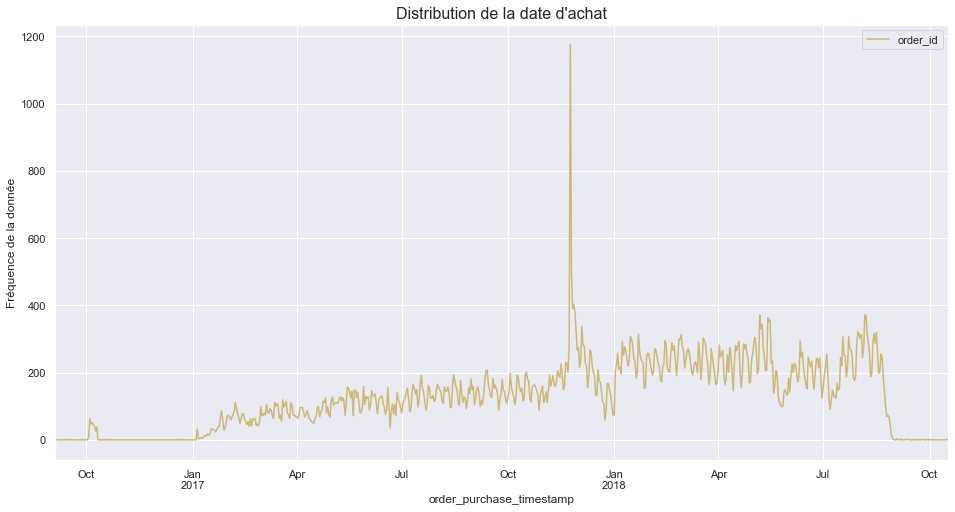

In [130]:
orders_mod = data_orders.copy()
orders_mod["order_purchase_timestamp"] = \
             pd.to_datetime(data_orders["order_purchase_timestamp"],
                            format='%Y-%m-%d %H:%M:%S')
counts = orders_mod.set_index("order_purchase_timestamp").\
                groupby(pd.Grouper(freq='D')).count()
fig = plt.figure(figsize=(16, 8))
plt.title("Distribution de la date d'achat", fontsize=16)
plt.ylabel("Fréquence de la donnée", fontsize=12)
ax = fig.gca()
counts.plot(y="order_id", use_index=True, ax=ax, color='y')

> <font color='red'>ANALYSE</font>

>   <font color='red'> On observe un pic du nombre de commandes sur les mois de **novembre et décembre** qui coincident aux fêtes de Noel. </font>

* Analyse des achats selon les jours de la semaine :

In [131]:

def transfo_month_d(i):

    global month_str
    if i == 1:
        month_str = "Jan"
    if i == 2:
        month_str = "Feb"
    if i == 3:
        month_str = "Mar"
    if i == 4:
        month_str = "Apr"
    if i == 5:
        month_str = "May"
    if i == 6:
        month_str = "Jun"
    if i == 7:
        month_str = "Jul"
    if i == 8:
        month_str = "Aug"
    if i == 9:
        month_str = "Sep"
    if i == 10:
        month_str = "Oct"
    if i == 11:
        month_str = "Nov"
    if i == 12:
        month_str = "Dec"
    return month_str


def transfo_time_day(x):
    global time_day
    if (x > 0 and x <= 12):
        time_day = "Morning"
    elif (x > 12 and x <= 18):
        time_day = "Afternoon"
    else:
        time_day = "Night"
    return time_day


data_orders["order_purchase_year"] = \
        data_orders["order_purchase_timestamp"].dt.year
data_orders["order_purchase_month"] = \
        data_orders["order_purchase_timestamp"].dt.month
data_orders["order_purchase_hour"] = \
        data_orders["order_purchase_timestamp"].dt.hour

data_orders["order_purchase_day"] = \
        data_orders["order_purchase_timestamp"].dt.day
data_orders["order_purchase_time_day"] = \
        data_orders["order_purchase_hour"].apply(transfo_time_day)
data_orders["order_purchase_dayofweek"] = \
        data_orders["order_purchase_timestamp"].dt.strftime("%a")

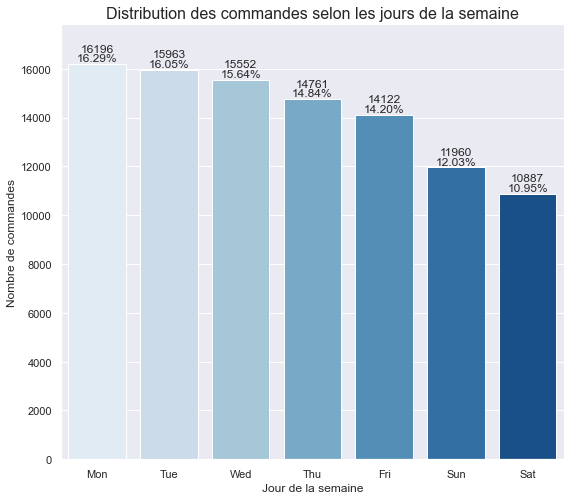

In [132]:
total = data_orders["order_purchase_dayofweek"].value_counts().sum()
plt.figure(figsize=(9, 8))

g = sns.countplot(x='order_purchase_dayofweek', data=data_orders,
                  order=data_orders['order_purchase_dayofweek'].value_counts().index,
                  palette="Blues")
g.set_title("Distribution des commandes selon les jours de la semaine",
            fontsize=16)
g.set_xlabel("Jour de la semaine", fontsize=12)
g.set_ylabel("Nombre de commandes", fontsize=12)
sizes = []
for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
           height + 100,
           '{:1.2f}%'.format(height/total*100),
           ha="center", fontsize=12)
    g.text(p.get_x()+p.get_width()/2.,
           height + 500,
           '{:1}'.format(height),
           ha="center", fontsize=12)

g.set_ylim(0, max(sizes) * 1.1)

plt.show()

> <font color='red'>ANALYSE</font>

>   <font color='red'> On observe un nombre de commande élevé en début de semaine de **lundi à jeudi**.
    Le week-end, les commandes sur le site sont en baisse surtout le samedi.</font>

* Analyse des achats selon la période de la journée :

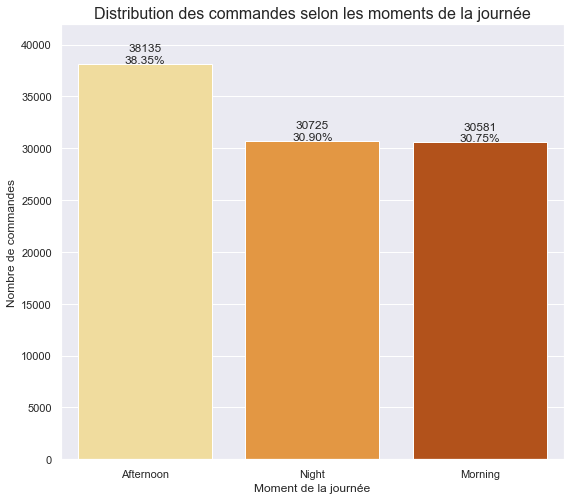

In [133]:
total = data_orders["order_purchase_time_day"].value_counts().sum()
plt.figure(figsize=(9, 8))

g = sns.countplot(x='order_purchase_time_day', data=data_orders,
                  palette="YlOrBr",
                  order=data_orders['order_purchase_time_day'].value_counts().index)
g.set_title("Distribution des commandes selon les moments de la journée",
            fontsize=16)
g.set_xlabel("Moment de la journée", fontsize=12)
g.set_ylabel("Nombre de commandes", fontsize=12)
sizes = []
for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
           height + 100,
           '{:1.2f}%'.format(height/total*100),
           ha="center", fontsize=12)
    g.text(p.get_x()+p.get_width()/2.,
           height + 1200,
           '{:1}'.format(height),
           ha="center", fontsize=12)

g.set_ylim(0, max(sizes) * 1.1)

plt.show()

> <font color='red'>ANALYSE</font>

>   <font color='red'> On observe un nombre de commande élevé **l'après-midi et la nuit après 18h**.</font>

* Analyse du délai de livraison en nombre de jours :

> Il faut convertir toutes les dates de type chaines de caractères en type date afin de calculer les durées.

In [134]:
def convert(df, columns_list):
    for column in columns_list:
        df[column] = pd.to_datetime(df[column])


orders_cp = data_orders.copy()
cols = ['order_purchase_timestamp', 'order_approved_at',
        'order_delivered_carrier_date', 'order_delivered_customer_date',
        'order_estimated_delivery_date']

convert(orders_cp, cols)
orders_cp['delivery_time'] = orders_cp['order_delivered_carrier_date'] \
                                - orders_cp['order_purchase_timestamp']

q95 = orders_cp['delivery_time'].quantile(.95)

delivered = orders_cp[orders_cp["order_status"] == "delivered"]
delivered.set_index(delivered['order_purchase_timestamp'], inplace=True)

delivered = delivered.sort_index()
delivered["dts"] = delivered["delivery_time"].dt.total_seconds()
delivered = delivered["dts"].resample("D").mean()
delivered = round(delivered/86400, 2)
delivered = delivered[delivered < 8]
print(delivered.describe())
m_del = delivered.mean()

count    603.000000
mean       3.252405
std        0.855460
min        0.230000
25%        2.655000
50%        3.170000
75%        3.770000
max        6.480000
Name: dts, dtype: float64


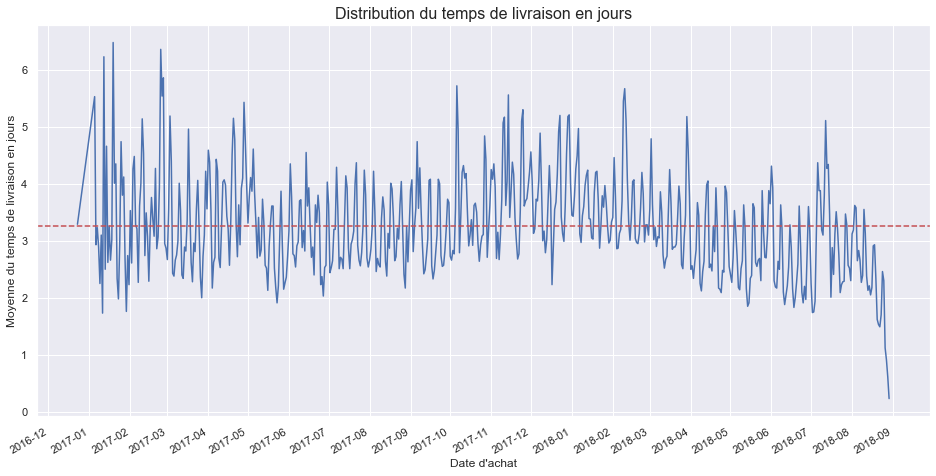

In [135]:
import matplotlib.dates as mdates

ax = delivered.plot(figsize=(16, 8))
plt.axhline(m_del, color="r", linestyle='--')
plt.title("Distribution du temps de livraison en jours", fontsize=16)
plt.xlabel("Date d'achat", fontsize=12)
plt.ylabel("Moyenne du temps de livraison en jours", fontsize=12)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))

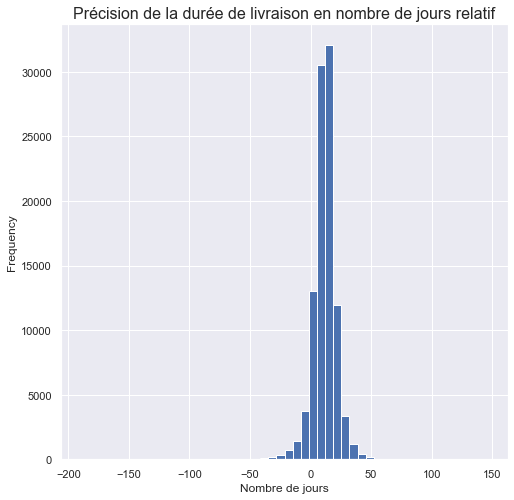

In [136]:
delai = (data_orders['order_estimated_delivery_date']\
         - data_orders['order_delivered_customer_date']) \
                / (np.timedelta64(1, 'D'))

plt.title("Précision de la durée de livraison en nombre de jours relatif",
          fontsize=16)
plt.xlabel("Nombre de jours", fontsize=12)
plt.ylabel("Fréquence", fontsize=12)

delai.plot(kind='hist', bins=50, figsize=(8, 8))

* Affichage en **Pie Chart** :

In [137]:
delta = []
for elt in delai.values.tolist():
    
    if elt <= 0:
        delta.append(0)
    elif (elt > 0 and elt <= 5):
        delta.append(5)
    elif (elt > 5 and elt <= 10):
        delta.append(10)
    elif (elt > 10 and elt <= 20):
        delta.append(20)
    elif (elt > 20 and elt <= 30):
        delta.append(30)
    elif (elt > 30 and elt <= 40):
        delta.append(40)
    else:
        delta.append(50)

labels = ['Livré en avance ou le jour même', 'Livré entre 1 à 5 jours',
          'Livré entre 5 et 10 jours', 'Livré entre 10 et 20 jours',
          'Livré entre 20 et 30 jours', 'Livré entre 30 et 40 jours',
          'Livré après 40 jours']
fig = go.Figure(data=[go.Pie(labels=labels, values=delta)])
fig.update_layout(title="Précision de la durée de livraison en nombre de jours relatif")
fig.show()

### Fichier data_customers


In [138]:
data_customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,Franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,Sao Bernardo Do Campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,Sao Paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,Mogi Das Cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,Campinas,SP


* Répartition des commandes par état :

In [139]:
fig = px.histogram(data_customers,
                   title="Répartition des commandes par état du Brésil",
                   x="customer_state",
                   barmode="group"
                   ).update_xaxes(categoryorder="total descending")
fig.show()

* Répartition des clients par état :

In [140]:
labels = data_customers["customer_state"].value_counts().index.tolist()
values = []

for elt in labels:
    subset = data_customers[data_customers["customer_state"] == elt]
    values.append(len(subset["customer_unique_id"].value_counts()))

fig = go.Figure(data=[go.Bar(x=labels, y=values)])
fig.update_layout(title="Répartition des clients par état du Brésil")
fig.update_traces(marker_color='rgb(158,202,225)',
                  marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.update_xaxes(categoryorder="total descending", title_text="Etat")
fig.update_yaxes(title_text="Nombre de clients")
fig.show()

* Répartition des commandes par ville (les plus importantes en nombre de commandes):

In [141]:
labels = data_customers["customer_city"].value_counts().index.tolist()
values = data_customers["customer_city"].value_counts().values.tolist()
labels_1 = []
values_1 = []


for i, elt in enumerate(values):
    if elt >= 500:
        values_1.append(elt)
        labels_1.append(labels[i])

In [142]:
fig = go.Figure(data=[go.Bar(x=labels_1, y=values_1)])
fig.update_layout(title="Répartition des commandes par ville (nombre > 500)")
fig.update_traces(marker_color='rgb(246,218,210)',
                  marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.update_xaxes(categoryorder="total descending", title_text="Ville")
fig.update_yaxes(title_text="Nombre de commandes")
fig.show()

* Répartition des clients par ville (les plus importantes) :

In [143]:
values_2 = []

for elt in labels_1:
    subset = data_customers[data_customers["customer_city"] == elt]
    values_2.append(len(subset["customer_unique_id"].value_counts()))

fig = go.Figure(data=[go.Bar(x=labels_1, y=values_2)])
fig.update_layout(title="Répartition des clients par ville du Brésil")
fig.update_xaxes(categoryorder="total descending", title_text="Ville")
fig.update_yaxes(title_text="Nombre de clients")
fig.show()

* Répartition des commandes par **customer_zip_code_prefix** :

In [144]:
labels = data_customers["customer_zip_code_prefix"]\
            .value_counts().index.tolist()
values = data_customers["customer_zip_code_prefix"]\
            .value_counts().values.tolist()
labels_1 = []
values_1 = []


for i, elt in enumerate(values):
    if elt >= 100:
        values_1.append(elt)
        labels_1.append(labels[i])

fig = go.Figure(data=[go.Pie(labels=labels_1, values=values_1)])
fig.update_layout(title="Répartition des Commandes par code postal (nombre > 100)")
fig.show()

> <font color='red'>ANALYSE</font>

>   <font color='red'> Les états de Sao Paulo, Rio de Janeiro ainsi que les villes de Brasilia, Belo Horizonte,
    Rio de Janeiro et Sao Paulo centralisent la majorité des commandes et des clients. </font>

* Localisation géographique des clients du site :

In [145]:
labels = data_customers["customer_unique_id"].value_counts().index.tolist()
values = data_customers["customer_unique_id"].value_counts().values.tolist()
labels_1 = []
values_1 = []
lat = []
lng = []


for i, elt in enumerate(values):
    if elt >= 5:
        values_1.append(elt)
        labels_1.append(labels[i])


for elt in labels_1:
    customer_zip = \
        data_customers[data_customers.customer_unique_id == elt]["customer_zip_code_prefix"]
    subset = \
        data_geolocation[data_geolocation.geolocation_zip_code_prefix.isin(customer_zip)]
    lat.append(subset["geolocation_lat"].mean())
    lng.append(subset["geolocation_lng"].mean())

In [146]:
import folium

m = folium.Map(location=[-23.56284, -46.6546], zoom_start=7)

i = 0
for (x, y) in zip(lat, lng):

    folium.CircleMarker(location=[x, y],
                        radius=20,
                        popup=labels_1[i],
                        color="#8db600",
                        fill=True,
                        fill_color="#8db600",
                        ).add_to(m)
    i += 1

m

> <font color='red'>ANALYSE</font>

> <font color='red'> Les plus gros clients du site Olist sont localisés autour de Sao Paulo et Rio de Janeiro. </font>


### Fichier data_order_payments :

In [147]:
data_order_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


* Distribution des montant des paiements :

In [148]:
data_order_payments["payment_value"].describe(include="all")

count    103886.000000
mean        154.100380
std         217.494064
min           0.000000
25%          56.790000
50%         100.000000
75%         171.837500
max       13664.080000
Name: payment_value, dtype: float64

Indicateurs statistiques :

Moyenne:
 154.10038041698365
Médiane:
 100.0
Mode:
 0    50.0
dtype: float64
Variance:
 47303.21247430867
Ecart type:
 217.49301707022383
Skewness:
 9.254009528478063
Kurtosis:
 241.8284419145052


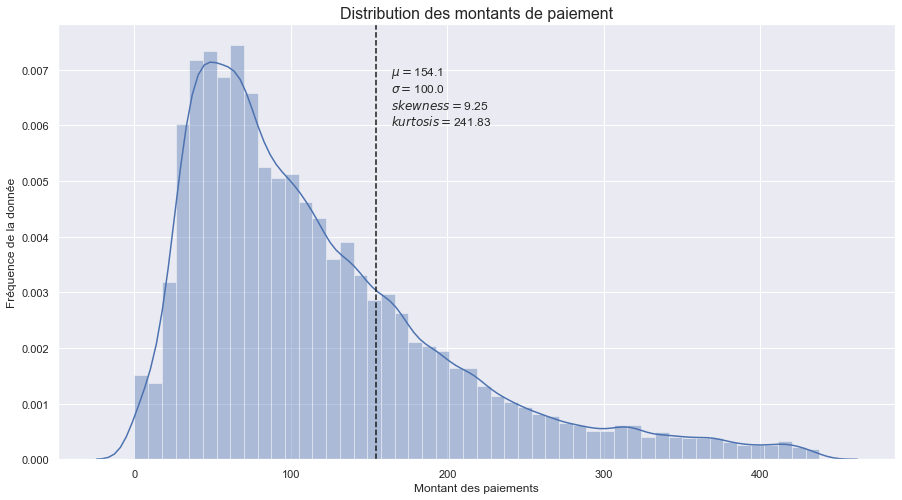

In [149]:
q95 = data_order_payments["payment_value"].quantile(.95)
payments_q95 = data_order_payments[data_order_payments["payment_value"]<q95]

plt.figure(figsize = (15, 8))
sns.distplot(payments_q95['payment_value'], kde=True)
plt.title ("Distribution des montants de paiement", fontsize=16)
plt.ylabel ("Fréquence de la donnée", fontsize=12)
plt.xlabel ("Montant des paiements", fontsize=12)

subset = data_order_payments['payment_value']
print("Indicateurs statistiques :\n")
print("Moyenne:\n",subset.mean())
print("Médiane:\n",subset.median())
print("Mode:\n",subset.mode())
print("Variance:\n",subset.var(ddof=0))
print("Ecart type:\n",subset.std(ddof=0))
print("Skewness:\n",subset.skew())
print("Kurtosis:\n",subset.kurt())

text1 = '$\mu=$' + str(round(subset.mean(),2))
text2 = '$\sigma=$' +str(round(subset.median(),2))
text3 = '$skewness=$' + str(round(subset.skew(),2))
text4 = '$kurtosis=$' + str(round(subset.kurt(),2))
text = text1 + "\n" + text2 + "\n" + text3 + "\n" + text4
plt.axvline(subset.mean(), color='k', linestyle='--')
plt.text(subset.mean()+10, 0.006, text, fontsize=12)
plt.show()

* R&partition des types de paiement :

In [150]:
labels = data_order_payments["payment_type"].value_counts().index.tolist()
values = data_order_payments["payment_type"].value_counts().values.tolist()
explode = (0.1, 0, 0, 0)
fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_layout(title="Distribution des types de paiement")
fig.show()

* Echelonnement des paiements :

In [151]:
fig = px.histogram(data_order_payments,
                     title="Répartition de l'échelonnement des paiements",
                     x="payment_installments",
                     barmode="group"
                     ).update_xaxes(categoryorder="total ascending")
fig.show()

> <font color='red'>ANALYSE</font>

>   <font color='red'> Plus de 70% des clients paient leur commande avec une carte de crédit, en une fois et pour un montant inférieur à 100 Real. </font>

### Fichier data_order_items :


> On souhaite afficher la localisation géographique du top13 (vente de plus de 1000 produits) des vendeurs du site.

In [152]:
data_order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [153]:
labels = data_order_items["seller_id"].value_counts().index.tolist()
values = data_order_items["seller_id"].value_counts().values.tolist()
labels_1 = []
values_1 = []
lat = []
lng = []



for i, elt in enumerate(values):
    if elt >= 1000: 
        values_1.append(elt)
        labels_1.append(labels[i])
        
for elt in labels_1:
    seller_zip = data_sellers[data_sellers.seller_id == elt]["seller_zip_code_prefix"]
    subset = data_geolocation[data_geolocation.geolocation_zip_code_prefix.isin(seller_zip)]
    lat.append(subset["geolocation_lat"].mean())
    lng.append(subset["geolocation_lng"].mean())


In [154]:
import folium
m = folium.Map(location=[-23.56284,-46.6546], zoom_start=7)

i = 0
for (x, y) in zip(lat, lng):
    
    folium.CircleMarker(location=[x, y],
                        radius=20,
                        popup=labels_1[i],
                        color="#3186cc",
                        fill=True,
                        fill_color="#3186cc",
                        ).add_to(m)
    i += 1

m

> <font color='red'>ANALYSE</font>

>   <font color='red'> Les 13 plus gros vendeurs de produits du site Olist sont localisés à Sao Paulo. </font>

* On souhaite afficher la localisation géographique du top10 (vente de moins de 1 produit) des derniers vendeurs du site.

In [155]:
labels_1 = []
values_1 = []
lat = []
lng = []

j = 0
for i, elt in enumerate(values):
    if elt == 1 and j < 10: 
        values_1.append(elt)
        labels_1.append(labels[i])
        j += 1

        
for elt in labels_1:
    seller_zip = data_sellers[data_sellers.seller_id == elt]["seller_zip_code_prefix"]
    subset = data_geolocation[data_geolocation.geolocation_zip_code_prefix.isin(seller_zip)]
    lat.append(subset["geolocation_lat"].mean())
    lng.append(subset["geolocation_lng"].mean())


In [156]:
m = folium.Map(location=[-23.56284,-46.6546], zoom_start=4)

i = 0
for (x, y) in zip(lat, lng):
    
    folium.CircleMarker(location=[x, y],
                        radius=20,
                        popup=labels_1[i],
                        color="	#ff2052",
                        fill=True,
                        fill_color="#ff2052",
                        ).add_to(m)
    i += 1
m

> <font color='red'>ANALYSE</font>

> <font color='red'> Les vendeurs ayant vendu un produit du site Olist sont localisés loin de Sao Paulo. </font>


### Fichier data_order_reviews :

In [157]:
data_order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


* Répartition des scores (meilleur note à 5) :

In [158]:
labels = data_order_reviews["review_score"].value_counts().index.tolist()
values = data_order_reviews["review_score"].value_counts().values.tolist()
fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_layout(title="Distribution des scores des commentaires")
fig.show()

> <font color='red'>ANALYSE</font>

> <font color='red'> Plus de la moitié des clients sont très satisfaits des commandes faites sur le site. Près de **12%** ne sont pas satisfaits en raison notamment de produits non livrés.</font>

* Proportion des commentaires renseignés ou non :

In [159]:
labels = ["Commentaires non renseignés", "Commentaires renseignés"]
values = []
nb_reviews = data_order_reviews.shape[0]

nb_reviews_null = \
data_order_reviews[data_order_reviews.review_comment_message.isnull()].shape[0]
pct_reviews_null = (nb_reviews_null / nb_reviews) * 100
values.append(pct_reviews_null)

nb_reviews_notnull = \
data_order_reviews[data_order_reviews.review_comment_message.notnull()].shape[0]
pct_reviews_notnull = (nb_reviews_notnull / nb_reviews) * 100
values.append(pct_reviews_notnull)

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_layout(title="Proportion des commentaires renseignés ou non")
fig.show()

> <font color='red'>ANALYSE</font>

> <font color='red'> Les commentaires non renseignés sont plus importants en proportion ce qui nous permet pas de savoir les raisons du mécontentement des clients. Le clustering permet de répondre à cette question.</font>

# 2. Transformation des données (feature engineering)

> On va fusionner les fichiers **data_orders, data_order_items,  data_order_payments, data_order_reviews, 
data_products, data_customers, data_sellers** en un seul : 

In [160]:
data_train = data_orders.merge(data_order_items, 
                               on='order_id',
                               how='left')
data_train = data_train.merge(data_order_payments,
                              on='order_id',
                              how='outer',
                              validate='m:m')
data_train = data_train.merge(data_order_reviews,
                              on='order_id',
                              how='outer')
data_train = data_train.merge(data_products,
                              on='product_id',
                              how='outer')
data_train = data_train.merge(data_customers,
                              on='customer_id',
                              how='outer')
data_train = data_train.merge(data_sellers,
                              on='seller_id',
                              how='outer')

data_train.to_csv("olist_fusion.csv", sep=',', index=False)

* Conversion des dates de type objet en type datetime :

In [161]:
cols = ['shipping_limit_date', 'review_creation_date',
        'review_answer_timestamp']

convert(data_train, cols)


def resumetable(df):
    
    
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name', 'dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    summary['Third Value'] = df.loc[2].values
    return summary

* Découpage des dates en année, mois, jour, jour de la semaine, moment de la journée : 

In [162]:
data_train["order_approved_year"] = \
            data_train["order_approved_at"].dt.year
data_train["order_approved_month"] = \
            data_train["order_approved_at"].dt.month
data_train["order_approved_hour"] = \
            data_train["order_approved_at"].dt.hour

data_train["order_approved_day"] = \
            data_train["order_approved_at"].dt.day
data_train["order_approved_time_day"] = \
            data_train["order_approved_hour"].apply(transfo_time_day)
data_train["order_approved_dayofweek"] = \
            data_train["order_approved_at"].dt.strftime("%a")


data_train["order_delivered_carrier_year"] = \
            data_train["order_delivered_carrier_date"].dt.year
data_train["order_delivered_carrier_month"] = \
            data_train["order_delivered_carrier_date"].dt.month
data_train["order_delivered_carrier_hour"] = \
            data_train["order_delivered_carrier_date"].dt.hour

data_train["order_delivered_carrier_day"] = \
            data_train["order_delivered_carrier_date"].dt.day
data_train["order_delivered_carrier_time_day"] = \
            data_train["order_delivered_carrier_hour"].apply(transfo_time_day)
data_train["order_delivered_carrier_dayofweek"] = \
            data_train["order_delivered_carrier_date"].dt.strftime("%a")


data_train["order_delivered_customer_year"] = \
            data_train["order_delivered_customer_date"].dt.year
data_train["order_delivered_customer_month"] = \
            data_train["order_delivered_customer_date"].dt.month
data_train["order_delivered_customer_hour"] = \
            data_train["order_delivered_customer_date"].dt.hour

data_train["order_delivered_customer_day"] = \
            data_train["order_delivered_customer_date"].dt.day
data_train["order_delivered_customer_time_day"] = \
            data_train["order_delivered_customer_hour"].apply(transfo_time_day)
data_train["order_delivered_customer_dayofweek"] = \
            data_train["order_delivered_customer_date"].dt.strftime("%a")


data_train["order_estimated_delivery_year"] = \
            data_train["order_estimated_delivery_date"].dt.year
data_train["order_estimated_delivery_month"] = \
            data_train["order_estimated_delivery_date"].dt.month
data_train["order_estimated_delivery_hour"] = \
            data_train["order_estimated_delivery_date"].dt.hour

data_train["order_estimated_delivery_day"] = \
            data_train["order_estimated_delivery_date"].dt.day
data_train["order_estimated_delivery_time_day"] = \
            data_train["order_estimated_delivery_hour"].apply(transfo_time_day)
data_train["order_estimated_delivery_dayofweek"] = \
            data_train["order_estimated_delivery_date"].dt.strftime("%a")



data_train["shipping_limit_year"] = \
            data_train["shipping_limit_date"].dt.year
data_train["shipping_limit_month"] = \
            data_train["shipping_limit_date"].dt.month
data_train["shipping_limit_hour"] = \
            data_train["shipping_limit_date"].dt.hour

data_train["shipping_limit_day"] = \
            data_train["shipping_limit_date"].dt.day
data_train["shipping_limit_time_day"] = \
            data_train["shipping_limit_hour"].apply(transfo_time_day)
data_train["shipping_limit_dayofweek"] = \
            data_train["shipping_limit_date"].dt.strftime("%a")


data_train["review_creation_year"] = \
            data_train["review_creation_date"].dt.year
data_train["review_creation_month"] = \
            data_train["review_creation_date"].dt.month
data_train["review_creation_hour"] = \
            data_train["review_creation_date"].dt.hour

data_train["review_creation_day"] = \
            data_train["review_creation_date"].dt.day
data_train["review_creation_time_day"] = \
            data_train["review_creation_hour"].apply(transfo_time_day)
data_train["shipping_limit_dayofweek"] = \
            data_train["review_creation_date"].dt.strftime("%a")


data_train["review_answer_year"] = \
            data_train["review_answer_timestamp"].dt.year
data_train["review_answer_month"] = \
            data_train["review_answer_timestamp"].dt.month
data_train["review_answer_hour"] = \
            data_train["review_answer_timestamp"].dt.hour

data_train["review_answer_day"] = \
            data_train["review_answer_timestamp"].dt.day
data_train["review_answer_time_day"] = \
            data_train["review_answer_hour"].apply(transfo_time_day)
data_train["review_answer_dayofweek"] = \
            data_train["review_answer_timestamp"].dt.strftime("%a")


In [163]:
resumetable(data_train)

Dataset Shape: (119151, 86)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value
0,order_id,object,0,99441,e481f51cbdc54678b7cc49136f2d6af7,e481f51cbdc54678b7cc49136f2d6af7,e481f51cbdc54678b7cc49136f2d6af7
1,customer_id,object,0,99441,9ef432eb6251297304e76186b10a928d,9ef432eb6251297304e76186b10a928d,9ef432eb6251297304e76186b10a928d
2,order_status,object,0,8,delivered,delivered,delivered
3,order_purchase_timestamp,datetime64[ns],0,98875,2017-10-02 10:56:33,2017-10-02 10:56:33,2017-10-02 10:56:33
4,order_approved_at,datetime64[ns],177,90733,2017-10-02 11:07:15,2017-10-02 11:07:15,2017-10-02 11:07:15
...,...,...,...,...,...,...,...
81,review_answer_month,int64,0,12,10,10,10
82,review_answer_hour,int64,0,24,3,3,3
83,review_answer_day,int64,0,31,12,12,12
84,review_answer_time_day,object,0,3,Morning,Morning,Morning


## a) Corrélations éventuelles entre les variables

* Corrélation entre variables quantitatives

> Dans un premier temps, examinons la correlation entre les variables numériques
  en déterminant le coefficient de corrélation de Pearson :

In [164]:
data_train_num = data_train.select_dtypes(include=['float64',
                                                   'int64'])
data_train_num.corr()

,order_purchase_year,order_purchase_month,order_purchase_hour,order_purchase_day,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,...,shipping_limit_hour,shipping_limit_day,review_creation_year,review_creation_month,review_creation_hour,review_creation_day,review_answer_year,review_answer_month,review_answer_hour,review_answer_day
order_purchase_year,1.000000,-0.551449,-0.005560,-0.043811,0.001888,-0.001718,0.034961,-0.046684,-0.051347,0.004546,...,-0.005045,-0.019275,0.956368,-0.482058,-0.030801,0.008274,0.943710,-0.457945,0.025804,0.003862
order_purchase_month,-0.551449,1.000000,-0.004736,0.001829,0.000003,0.000338,0.003696,0.004802,0.029682,0.005246,...,-0.022338,0.027775,-0.470827,0.849047,0.032011,0.038267,-0.449891,0.809377,0.014869,0.028361
order_purchase_hour,-0.005560,-0.004736,1.000000,-0.013520,-0.014182,0.008101,0.005266,0.004544,0.014219,-0.004845,...,0.567789,-0.006484,-0.006512,-0.002487,0.003629,0.005470,-0.005955,-0.002498,0.013658,-0.004008
order_purchase_day,-0.043811,0.001829,-0.013520,1.000000,0.017495,-0.010648,-0.016259,-0.009856,0.002250,-0.001750,...,-0.021964,0.071521,-0.024558,0.066023,-0.015536,-0.139393,-0.025104,0.069812,0.005346,-0.178960
order_item_id,0.001888,0.000003,-0.014182,0.017495,1.000000,-0.060461,-0.030697,-0.002869,0.073810,0.265213,...,-0.032827,0.005292,-0.002407,0.009194,-0.004187,-0.002405,-0.003492,0.011132,0.010431,0.000123
price,-0.001718,0.000338,0.008101,-0.010648,-0.060461,1.000000,0.415944,0.006837,0.277672,0.739242,...,0.032824,-0.009983,-0.000702,0.003321,-0.002274,-0.001638,-0.001159,0.003708,-0.003155,0.001406
freight_value,0.034961,0.003696,0.005266,-0.016259,-0.030697,0.415944,1.000000,0.022343,0.185711,0.373767,...,0.011924,-0.007735,0.040731,0.010658,-0.004102,0.006134,0.040655,0.011560,0.004774,0.002342
payment_sequential,-0.046684,0.004802,0.004544,-0.009856,-0.002869,0.006837,0.022343,1.000000,-0.086509,-0.064466,...,0.042501,-0.007846,-0.047786,0.006947,-0.000479,0.008913,-0.048877,0.009308,0.012749,0.004900
payment_installments,-0.051347,0.029682,0.014219,0.002250,0.073810,0.277672,0.185711,-0.086509,1.000000,0.273657,...,0.201372,-0.000098,-0.048894,0.029748,0.003886,-0.004907,-0.049050,0.029352,-0.003954,0.000505
payment_value,0.004546,0.005246,-0.004845,-0.001750,0.265213,0.739242,0.373767,-0.064466,0.273657,1.000000,...,-0.003025,-0.009088,0.003475,0.013519,-0.003941,-0.005010,0.002699,0.014355,0.002717,0.001254


> Observons plus particulièrement les corrélations entre la colonne **payment_value** et les autres colonnes sachnat qu'on définit le degré de corrélation suivant l'échelle ci-dessous :

  * 0.00-0.19 “très faible”
  *  0.20-0.39 “faible”
  * 0.40-0.59 “modéré”
  * 0.60-0.79 “fort”
  * 0.80-1.00 “ très fort”

In [165]:
correlations = data_train.corr()['payment_value'].sort_values()

print('Fortes corrélations positives:\n', correlations.tail(15))
print('\nFortes corrélations négatives:\n', correlations.head(2))

Fortes corrélations positives:
 review_answer_month               0.014355
order_estimated_delivery_month    0.018466
customer_zip_code_prefix          0.054504
seller_zip_code_prefix            0.069810
product_length_cm                 0.138758
product_width_cm                  0.148611
product_description_lenght        0.156120
product_height_cm                 0.217183
order_item_id                     0.265213
payment_installments              0.273657
product_weight_g                  0.303332
freight_value                     0.373767
price                             0.739242
payment_value                     1.000000
order_estimated_delivery_hour          NaN
Name: payment_value, dtype: float64

Fortes corrélations négatives:
 review_score         -0.084434
payment_sequential   -0.064466
Name: payment_value, dtype: float64


> <font color='red'> Il y a de fortes corrélations entre **payment_value** et les variables **price, freight_value, product_weight_g, payment_installments**.
 De plus, **review_score** est correlé négativement à **payment_value.**</font>

* Affichage d'un heatmap pour la visualisation des corrélations avec **payment_value** 

In [166]:
ext_data = data_train[['payment_value', 'price', 'freight_value',
                       'product_weight_g', 'payment_installments']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,payment_value,price,freight_value,product_weight_g,payment_installments
payment_value,1.000000,0.739242,0.373767,0.303332,0.273657
price,0.739242,1.000000,0.415944,0.339375,0.277672
freight_value,0.373767,0.415944,1.000000,0.611594,0.185711
product_weight_g,0.303332,0.339375,0.611594,1.000000,0.177539
payment_installments,0.273657,0.277672,0.185711,0.177539,1.000000


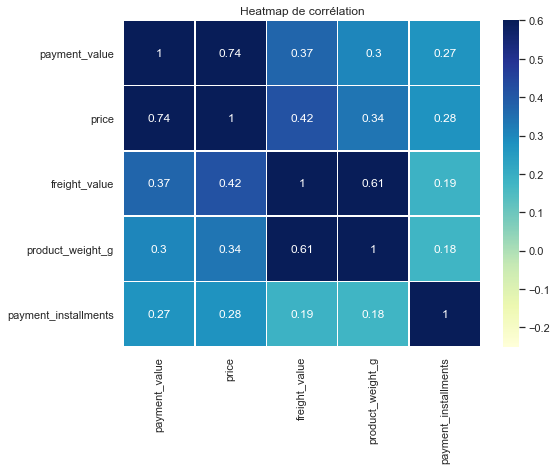

In [167]:
plt.figure(figsize=(8, 6))
sns.heatmap(ext_data_corrs, cmap="YlGnBu",
            vmin=-0.25, annot=True, vmax=0.6, linewidths=.5)
plt.title('Heatmap de corrélation')
plt.show()

> <font color='red'> Il y a de fortes corrélations entre **payment_value** et la variable **price**.
 Mais aussi, entre **product_weight_g** et **freight_value.**</font>

* Corrélation entre variables quantitatives et qualitatives :

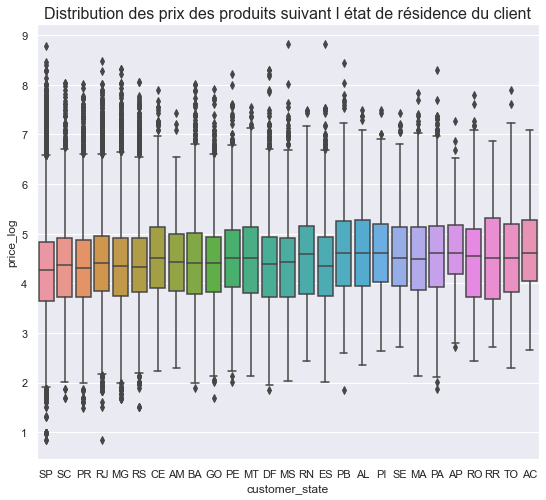

In [168]:
data_train['price_log'] = np.log(data_train['price'] + 1.5)

plt.figure(figsize = (9, 8))
plt.title('Distribution des prix des produits suivant l état de résidence du client',
          fontsize=16)
plot = sns.boxplot(x="customer_state", y="price_log", data=data_train)

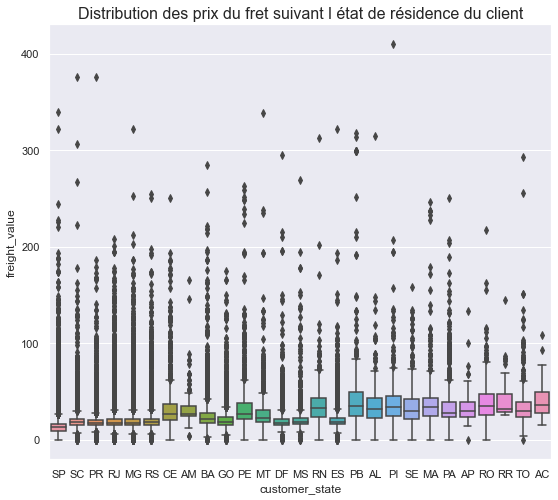

In [169]:
plt.figure(figsize = (9, 8))
plt.title('Distribution des prix du fret suivant l état de résidence du client',
          fontsize=16)
plot = sns.boxplot(x="customer_state", y="freight_value", data=data_train)

> <font color='red'> La distribution des prix des produits commandés sur le site Olist semble homogène sur l'ensemble des états du Brésil. Le pix du fret est le plus bas pour les états de **SP, SC, PR**.</font>

## b) Transformation des variables catégorielles

> On peut afficher les types de variables et leur nombre par type :

In [170]:
data_train.dtypes.value_counts()

object            30
int64             26
float64           23
datetime64[ns]     8
dtype: int64

> Il y a 18 colonnes de type object donc des chaines de caractères. On peut chercher le nombre de valeurs distinctes pour chacune de ces variables catégorielles.

In [171]:
data_train.select_dtypes('object').apply(pd.Series.nunique,
                                         axis=0)

order_id                              99441
customer_id                           99441
order_status                              8
order_purchase_time_day                   3
order_purchase_dayofweek                  7
product_id                            32951
seller_id                              3095
payment_type                              5
review_id                             99173
review_comment_title                   3739
review_comment_message                36920
product_category_name                    73
customer_unique_id                    96096
customer_city                          4119
customer_state                           27
seller_city                             611
seller_state                             23
order_approved_time_day                   3
order_approved_dayofweek                  7
order_delivered_carrier_time_day          3
order_delivered_carrier_dayofweek         7
order_delivered_customer_time_day         3
order_delivered_customer_dayofwe

> Il est important de convertir les données des colonnes catégorielles en données numériques afin
d'être exploitable par le modèle de machine learning. Les techniques utilisées sont le <font color='red'>**label encoding**</font> pour les variables avec moins de 2 catégories et le <font color='red'>**one-hot encoding**</font> pour les variables avec plus de 2 catégories.

* Label encoding :

In [172]:
le = LabelEncoder()
le_count = 0

for col in data_train:
    if data_train[col].dtype == 'object':
        if len(list(data_train[col].unique())) <= 2:
            le.fit(data_train[col])
            data_train[col] = le.transform(data_train[col])
            le_count += 1

print('%d colonnes avec la méthode label encoded.' % le_count)

2 colonnes avec la méthode label encoded.


* One-hot encoding pour les variables qualitatives avec plus de 2 catégories en retirant les zones suffxés **_id** :

In [173]:
data_to_save = data_train[['order_id', 'customer_id',
                          'product_id', 'seller_id', 'review_id',
                          'review_comment_title', 
                          'review_comment_message',
                          'customer_unique_id', 'customer_city',
                          'seller_city',
                          'order_purchase_timestamp',
                          'order_approved_at',
                          'order_delivered_carrier_date',
                          'order_delivered_customer_date',
                          'order_estimated_delivery_date',
                          'shipping_limit_date',
                          'review_creation_date',
                          'review_answer_timestamp']]

train = data_train.drop(columns=['order_id', 'customer_id',
                        'product_id', 'seller_id', 'review_id',
                        'review_comment_title', 
                        'review_comment_message',
                        'customer_unique_id', 'customer_city',
                        'seller_city',
                        'order_purchase_timestamp',
                        'order_approved_at',
                        'order_delivered_carrier_date',
                        'order_delivered_customer_date',
                        'order_estimated_delivery_date',
                        'shipping_limit_date',
                        'review_creation_date',
                        'review_answer_timestamp'])


features = list(train.columns)

train = pd.get_dummies(train)

## c) Traitement des valeurs manquantes

> On impute les données manquantes par la moyenne des différentes variables et on supprime les variables de variance nulle afin d'améliorer le clustering. 

In [174]:
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import VarianceThreshold
from collections import Counter


colonnes = []


def feature_selection(train_instances):


    print('Sélection des variables ...')
    selector = VarianceThreshold()
    selector.fit(train_instances)
    print('Nombre de variables utilisées ... ' +
          str(Counter(selector.get_support())[True]))
    var = list(selector.get_support())
    for count, e in enumerate(var):
        if e == True:
           colonnes.append(train.columns[count])

    print('Nombre de variables ignorées ... ' +
          str(Counter(selector.get_support())[False]))
    return selector

fs = feature_selection(train)
train = fs.transform(train)


imputer = SimpleImputer(strategy='mean')
imputer.fit(train)
train = imputer.transform(train)


data_train = pd.DataFrame(train, columns=colonnes)
print('Format du fichier train : ', data_train.shape)

Sélection des variables ...
Nombre de variables utilisées ... 250
Nombre de variables ignorées ... 2
Format du fichier train :  (119151, 250)


## d) Génération du nouveau fichier <font color='red'>**olist_new.csv**</font>

In [175]:
data_train.to_csv("olist_new.csv", sep=',', index=False)